In [22]:
%matplotlib inline

In [23]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd
import numpy as np
import pytesseract as pt
from pytesseract import Output
from shapely.geometry import Polygon
from demo_class import DemoOCR
from IPython.display import HTML

In [24]:
pt.pytesseract.tesseract_cmd = 'C:/Program Files/Tesseract-OCR/tesseract.exe'

In [25]:
FILE = 'example_ready/demo1.jpg'

with open(FILE, 'rb') as img_obj:
    img_bytes = img_obj.read()

In [26]:
demo1 = DemoOCR('credentials/test3.json', img_bytes)

## Общая информацию о системах распознания

![trends](trends2.png)

## Общее описание методики сравнения

Для объекивного сопоставлению между собой работы обоих движков мы применим подход "от обратного". Возьмем готовое изображение с текстом и попробуем применить к нему несколко фильтров, ухудшающих качесьтво исходной картинки. На каждом шаге попробуем сравнивать насколько хорошо удалось распознать текст каждому из движков по сравнению результатом распознания на "базовом" изображении. Но сначала - несколько особенностей работы каждого из движков, которые мы должны учесть в в нашей методике сравнения.  

## Tesseract: get joined what you might expect to be splitted 

Ситуация кажется в порядке, если работать с картинками хорошего качества. Но все меняется, если приходится иметь дело с плохими изображениями. Тогда Тессеракт имеет тенденцию некорректно определять границы объектов, которые удвлось распознать. Из-за этого нельзя в полной мере полагатся на его метод image_to_data 

In [6]:
def get_tes_data(image_bytes):
    tes_rw = pt.image_to_data(demo1.bytes_to_image(image_bytes)[0],
                              output_type=Output.DICT)
    tes_df = pd.DataFrame.from_dict(tes_rw)
    tes_df['text'] = tes_df['text'].replace(r'^\s+$', '', regex=True)
    tes_fl = (tes_df[(tes_df['text'].astype(bool)) &
                     (tes_df['conf'] != 0)])
    tes_fl = tes_fl.apply(demo1.expand_coordinates, axis=1)
    tes_gm = tes_fl.apply(demo1.fit_to_poly, axis=1).reset_index(drop=True)
    return tes_gm

In [7]:
blurred = cv2.GaussianBlur(demo1.bytes_to_image(img_bytes)[0], (13, 13), 0)
blurred_bytes = cv2.imencode('.png', blurred)[1].tobytes()

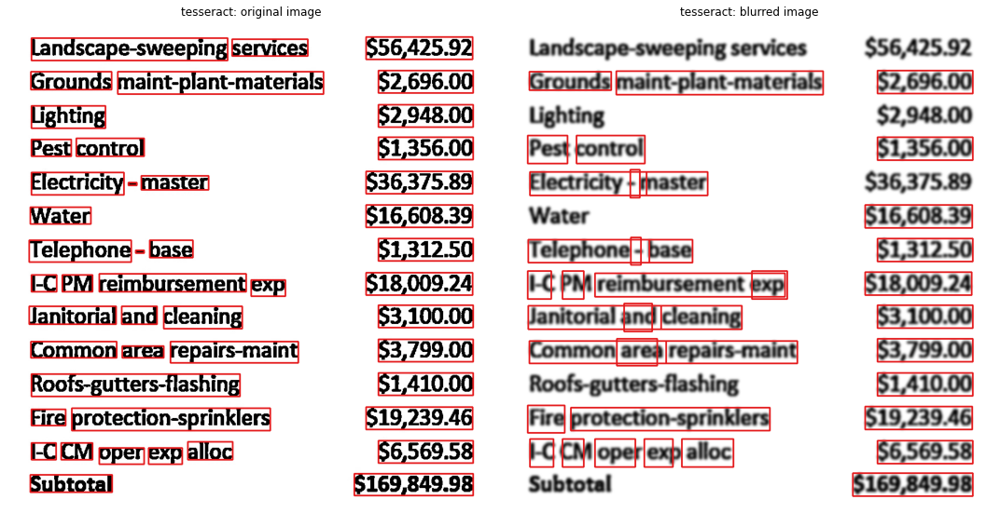

In [8]:
fig, ax = plt.subplots(1, 2, figsize=(15, 10))
titles = ['tesseract: original image', 'tesseract: blurred image']
images = [img_bytes, blurred_bytes]
for i in range(2):
    view = demo1.draw_rects(get_tes_data(images[i]), images[i], (228, 26, 28))
    ax[i].axis("off")
    ax[i].set_adjustable("box")
    ax[i].title.set_text(titles[i])
    ax[i].imshow(view)
fig.tight_layout()

Вот как именно накладываются друг на друга полигоны:

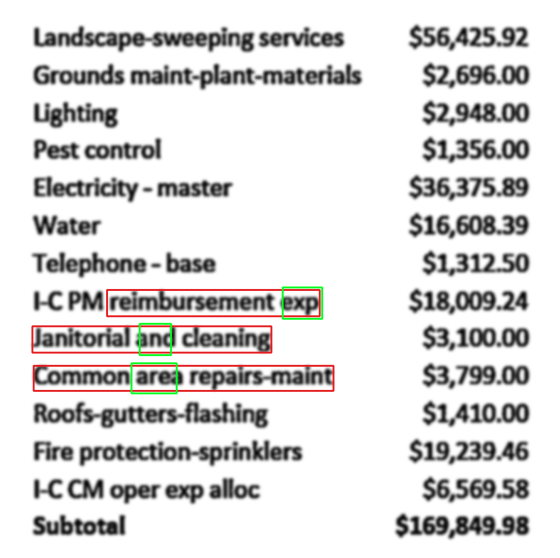

In [9]:
tes_data_bl = get_tes_data(images[1])
view1 = demo1.draw_rects(tes_data_bl.loc[[12, 14, 17]],
                         blurred_bytes,
                         (228, 26, 28))
view1_bytes = cv2.imencode('.png', view1)[1].tobytes()
view2 = demo1.draw_rects(tes_data_bl.loc[[13, 15, 18]],
                         view1_bytes,
                         (0, 255, 28))

plt.figure(figsize=(10, 10))
plt.axis('off')
plt.imshow(view2)

Чтобы исправить это, мы пройдемся по всем полигонам и откорректируем их границы в случае наложения друг на друга. В результате получим границы точно осоответствующие тексте, в них распознанному. Впоследствии мы вставим этот алгоритм в метод получения распознанных данных от Тессеракта на каждой итерации в нашем сравнительном подходе.
Теперь выдача от Тессеракта будет выглядеть так:

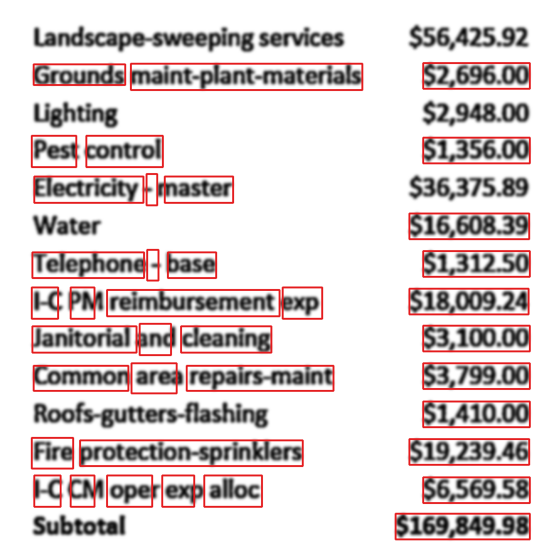

In [10]:
for g, p1 in tes_data_bl.iterrows():
    poly1 = Polygon(p1['poly'])
    overlapped = []
    for h, p2 in tes_data_bl.iterrows():
        if g == h:
            continue
        poly2 = Polygon(p2['poly'])
        if poly1.contains(poly2.centroid):
            overlapped.append(p2['poly'])
    if overlapped:
        leftmost_x0 = min([x[0][0] for x in overlapped])
        tes_data_bl.loc[g]['poly'][1] = (leftmost_x0 - 5,
                                         tes_data_bl.loc[g]['poly'][1][1])
        tes_data_bl.loc[g]['poly'][2] = (leftmost_x0 - 5,
                                         tes_data_bl.loc[g]['poly'][2][1])

plt.figure(figsize=(10, 10))
plt.axis('off')
plt.imshow(demo1.draw_rects(tes_data_bl, blurred_bytes, (228, 26, 28)))

## Google Vision: get splitted what you might expect to be joined

В противоположность Тессеракту, в результате распознания от Гугл Вижн мы получаем гораздо более раздробленные блоки. Наверное, это хорошор в контексте избавления от знаков препинаня, но, как в нашем примере, в случае работ ы с фин. данными может быть нежелательным паттерном. Обратите внимание на знаки валюты в колонке в цифрами:  

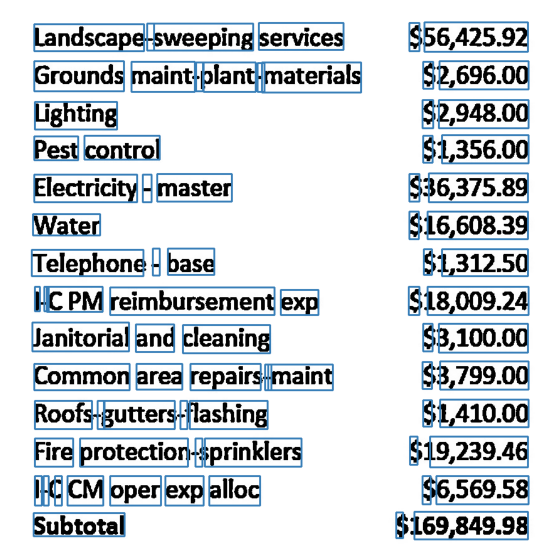

In [11]:
ggl_data = demo1.get_ggl_ocr_data(img_bytes)

plt.figure(figsize=(10, 10))
plt.axis('off')
plt.imshow(demo1.draw_rects(ggl_data, img_bytes, (55, 126, 184)))

## Методика сравненеия: нюансы

Таким образом, чтобы корректно сравнить между собой работы Тессеракт и Гугл Вижн нужно сперва позаботиться о том, чтобы определить некие общие грницы блоков, в которых удалось распознать текст. Мы это сделаем проходом по исходным данным вот таким алгоритмом:

D:\install\Anaconda3\envs\env_tes\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


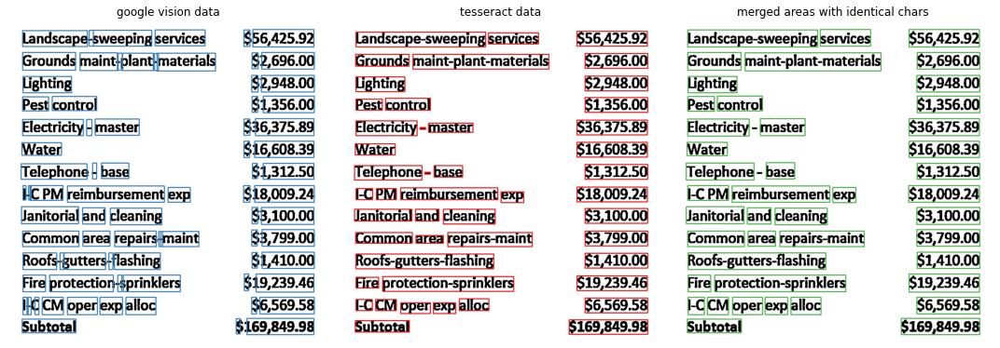

In [12]:
tes_data = demo1.get_tes_ocr_data(img_bytes)
ggl_data_orig, tes_data_orig = ggl_data.copy(), tes_data.copy()

should_restart = True
while should_restart:
    should_restart = False
    for i, trow in tes_data.iterrows():
        for j, grow in ggl_data.iterrows():
            tpoly = Polygon(trow['poly'])
            gpoly = Polygon(grow['poly'])
            if (demo1.has_intersection(tpoly, gpoly) and
                    not tpoly.equals(gpoly)):
                points = np.array(trow['poly'] + grow['poly'])
                min_x, min_y, max_x, max_y = demo1.get_bbox_values(points)
                bbox = [(min_x, min_y),
                        (max_x, min_y),
                        (max_x, max_y),
                        (min_x, max_y)]
                tes_data['poly'].iloc[i] = bbox
                ggl_data['poly'].iloc[j] = bbox
                should_restart = True
                break

collated = demo1.collate_data(ggl_data, tes_data, col_poly='poly')

baseline = collated.apply(demo1.compare_text, axis=1)
baseline = baseline[(baseline['res'] == 'matched') &
                    (baseline['text_g'].str.len() >= 2)]
baseline['init_scale'] = baseline.apply(demo1.get_scale_ratio, axis=1)

fig, ax = plt.subplots(1, 3, figsize=(15, 10))
titles = ['google vision data',
          'tesseract data',
          'merged areas with identical chars']
ocr_data = [ggl_data_orig, tes_data_orig, baseline]
rgb_colors = [(55, 126, 184), (228, 26, 28), (77, 175, 74)]
for i in range(3):
    view = demo1.draw_rects(ocr_data[i], img_bytes, rgb_colors[i])
    ax[i].axis("off")
    ax[i].set_adjustable("box")
    ax[i].title.set_text(titles[i])
    ax[i].imshow(view)
fig.tight_layout()

В последствии на каждом шаге применения фильтра, ухудшающего наше исходное изображение, мы будем отслеживать результативность распознания именно с пределах установленным нами блоков! Для наглядности количество правильно распознанных символов (в соответствующей позиции) мы будем отмечать горизонталым баром соответствующего цвета. Чем короче бар в пределах блока, тем меньше символов по сравнению с базоывм проходом распознал соответствующий движок на текущей итерации.

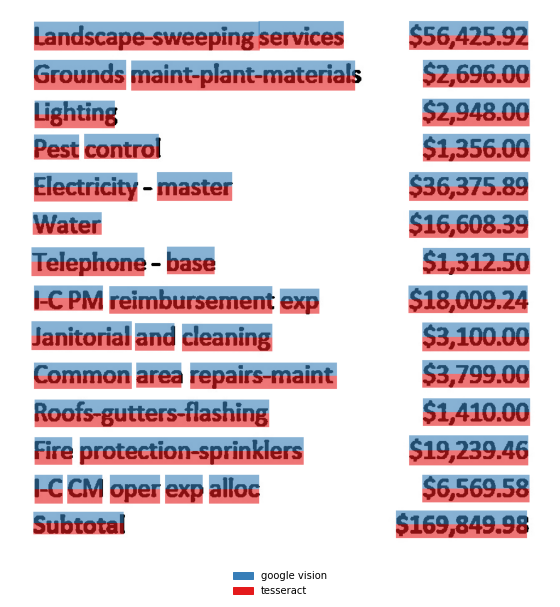

In [13]:
initial_bars = demo1.draw_stacked_bars(baseline,
                                       img_bytes,
                                       col_poly='poly')

ggl_legend = mpatches.Patch(color='#377eb8', label='google vision')
tes_legend = mpatches.Patch(color='#e41a1c', label='tesseract')

plt.figure(figsize=(10, 10))
plt.axis('off')
plt.imshow(initial_bars)
plt.legend(bbox_to_anchor=(0.5, -0.1),
           loc='lower center',
           handles=[ggl_legend, tes_legend],
           frameon=False)

## Putting it all together

Отслеживая результаттивность движков на каждой итерации мы составим общее представление об особенностях их работы с изображениями того или иного качества. Вот, например, как будут выглядеть промежуточные результаты применения трех фильтров к исходному изображению: 

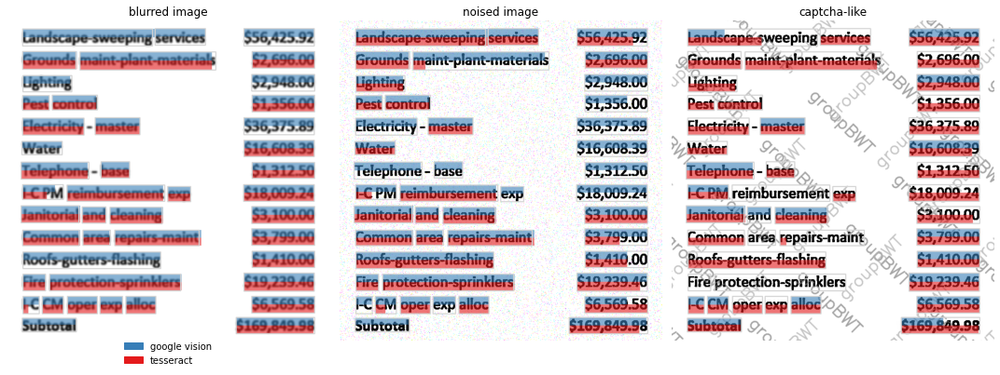

In [14]:
noised = demo1.add_gaussian_noise(img_bytes, 0.23)
noised_bytes = cv2.imencode('.png', noised)[1].tobytes()

captcha = demo1.put_watermark(img_bytes, (180, 180, 180, 255))
captcha_bytes = cv2.imencode('.png', captcha)[1].tobytes()

fig, ax = plt.subplots(1, 3, figsize=(15, 10))
titles = ['blurred image',
          'noised image',
          'captcha-like']
view_bytes = [blurred_bytes, noised_bytes, captcha_bytes]
for i in range(3):
    iter_data = demo1.get_iter_data(view_bytes[i])
    iter_bars = demo1.draw_stacked_bars(iter_data,
                                        view_bytes[i],
                                        col_poly='poly_base')
    iter_bars_bytes = cv2.imencode('.png', iter_bars)[1].tobytes()
    iter_view = demo1.draw_rects(baseline, iter_bars_bytes, (211, 211, 211))
    ax[i].axis("off")
    ax[i].set_adjustable("box")
    ax[i].title.set_text(titles[i])
    ax[i].imshow(iter_view)
    if i == 0:
        ax[i].legend(bbox_to_anchor=(0.5, -0.1),
                     loc='lower center',
                     handles=[ggl_legend, tes_legend],
                     frameon=False)
fig.tight_layout()

Теперь, когла мы разобрались с особенностями методики сравнения, мы можем увидеть, как работает наш подхолд в динамике: 

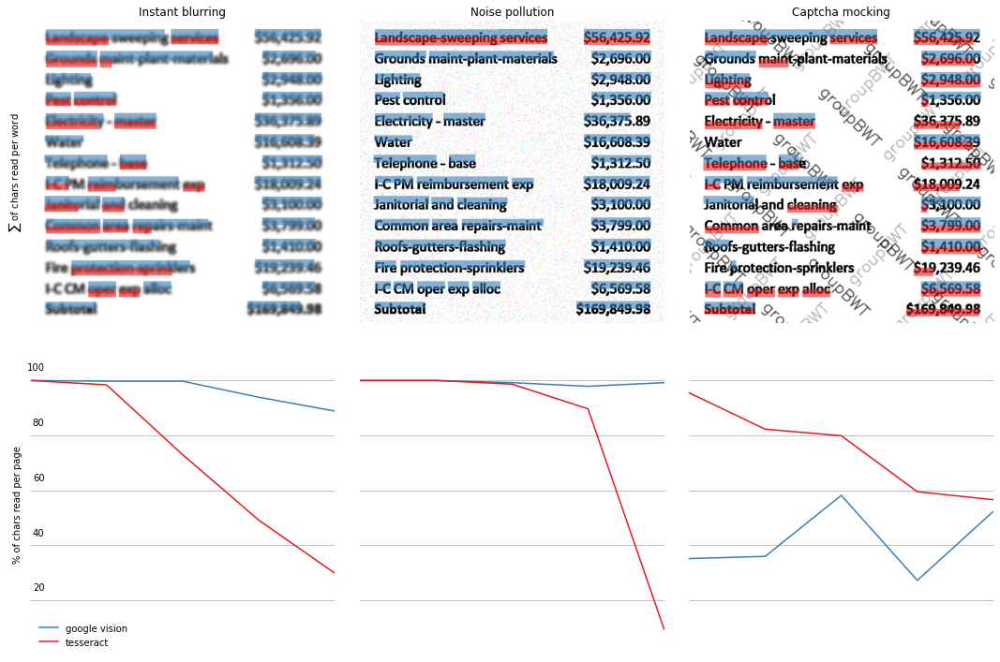

In [15]:
demo1.make_animation()

И еще на одном примере:

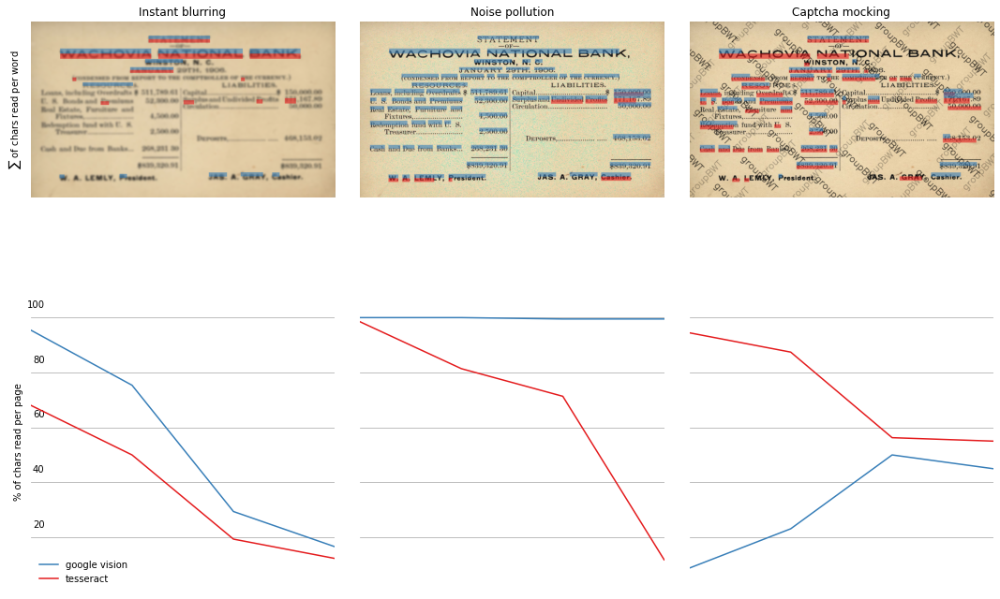

In [18]:
FILE = 'example_ready/Wachovia_National_Bank_1906_statement.jpg'
with open(FILE, 'rb') as img_obj:
    img_bytes = img_obj.read()    
demo2 = DemoOCR('credentials/test3.json', img_bytes)
demo3.make_animation()

In [27]:
HTML(demo1.make_animation().to_jshtml())

## Выводы

Оба движка учспешно применяются в бизнес-проектах. Похоже, что Тессеракт более чувствителен к качеству входящих изображений и требует их более тщатиельной предварительной оббработке. Оба движка плохо распознают текст с подложкой. Но основной недостаток Гугл Вижн - органиченные условия для бесплатного использования. Тем не менее, в зависимости от требований и бюджета проекта можно подобрать и настроить любой из двух предстваленных в обзоре инструментов.